In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNet,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score ,confusion_matrix ,roc_curve,roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
import seaborn as sns
import pickle
%matplotlib inline

In [3]:
df= pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")

In [4]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Insights That We Got From Above Analysis 
1. There are no missing values in the dataset
2. The dataset is little bit skewed
3. In many columns there are too many zeros like not null but zeros so we will replace those values 


In [6]:
df['BMI'] = df['BMI'].replace(0,df['BMI'].mean())

In [7]:
df['BloodPressure'] = df['BloodPressure'].replace(0,df['BloodPressure'].mean())

In [8]:
df['Insulin'] = df['Insulin'].replace(0,df['Insulin'].mean())

In [9]:
df['Glucose'] = df['Glucose'].replace(0,df['Glucose'].mean())

In [10]:
df['SkinThickness'] = df['SkinThickness'].replace(0,df['SkinThickness'].mean())

In [11]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

 Here in some columns there is a skewness in the data that means they are not normally distributed so checking for outliers

<AxesSubplot:>

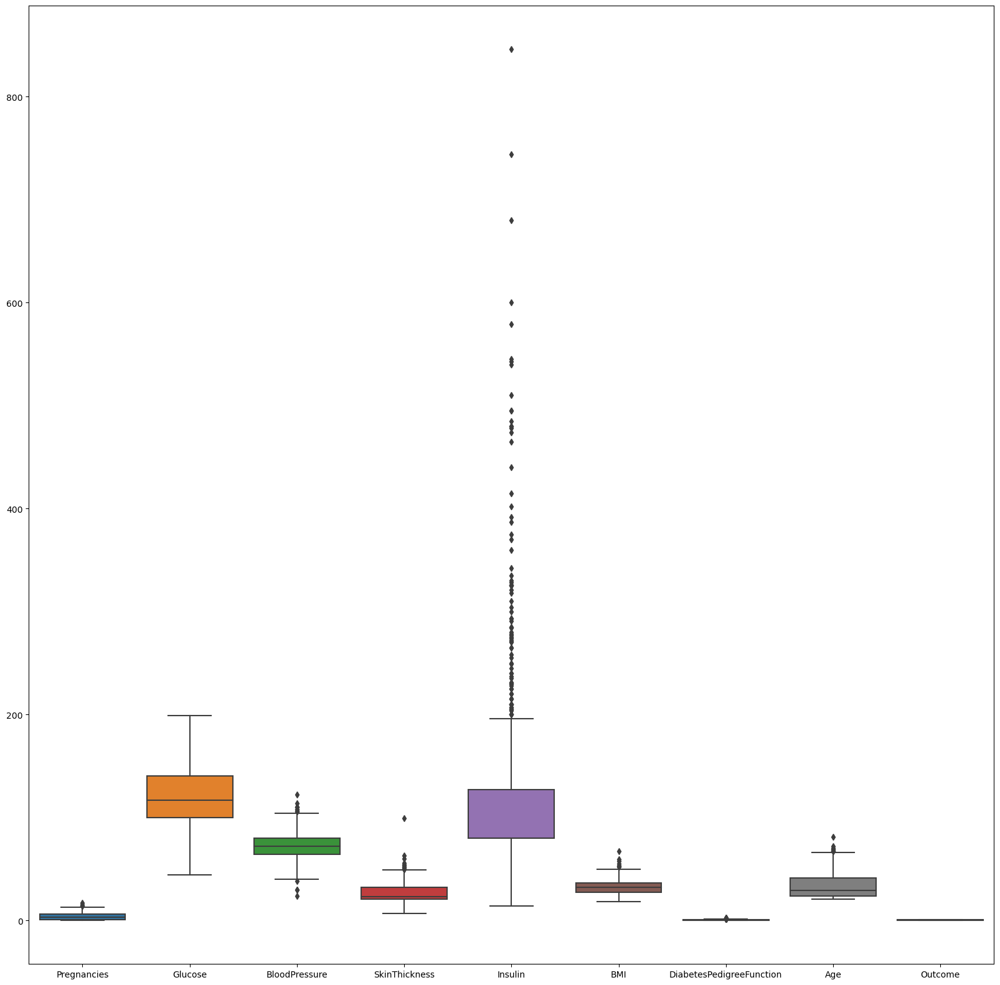

In [12]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data = df, ax = ax)

Here we can clearly see that there are mutiple outliers in the dataset columns . So we ned to handle outliers

In [13]:
q = df['Insulin'].quantile(.90)
df_new = df[df['Insulin']<q]

<AxesSubplot:>

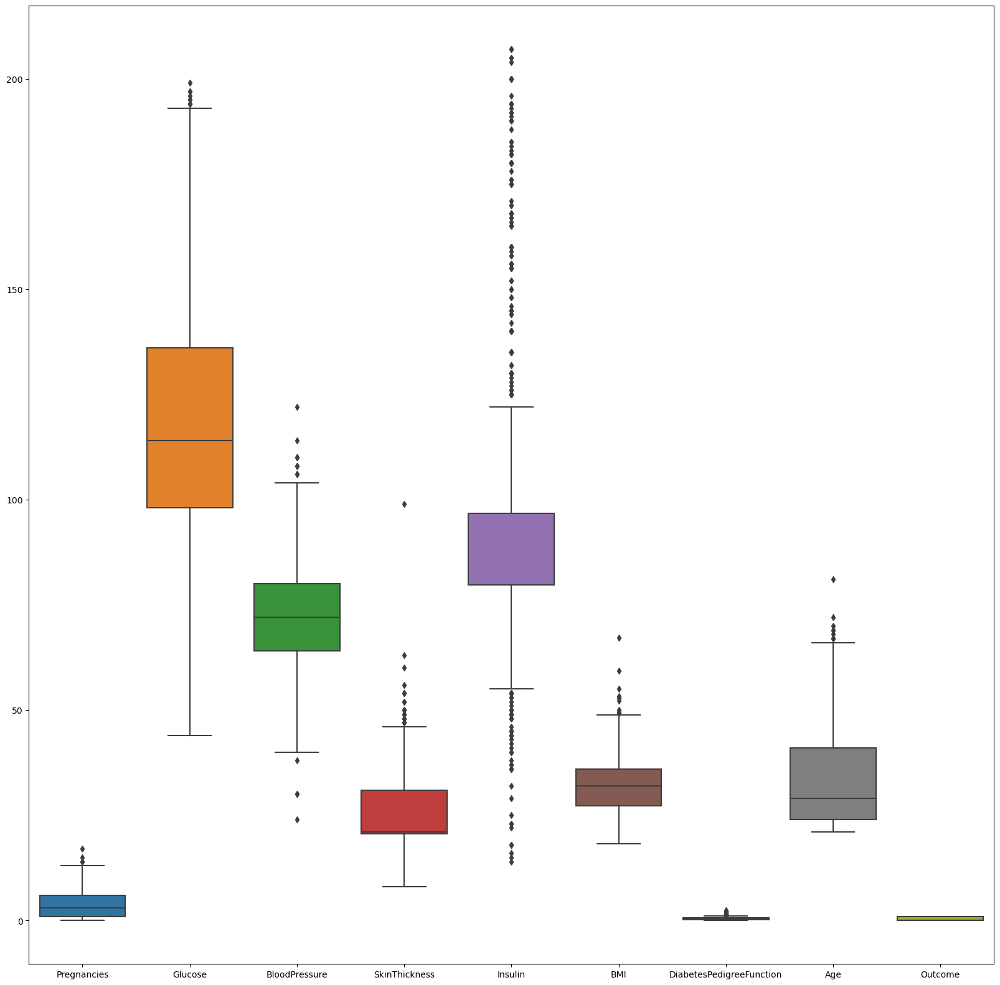

In [14]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data = df_new,ax = ax)

Here removing some part of data is causing data loss and also it is affecting other columns so we will try one by one 

In [15]:
q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies'] < q]

 
q = df_new['BMI'].quantile(.99)
df_new = df_new[df_new['BMI'] < q]

q = df_new['SkinThickness'].quantile(.99)
df_new = df_new[df_new['SkinThickness'] < q]

q = df_new['Insulin'].quantile(.95)
df_new = df_new[df_new['Insulin'] < q]

q = df_new['DiabetesPedigreeFunction'].quantile(.99)
df_new = df_new[df_new['DiabetesPedigreeFunction'] < q]

q = df_new['Age'].quantile(.99)
df_new = df_new[df_new['Age'] < q]


<AxesSubplot:>

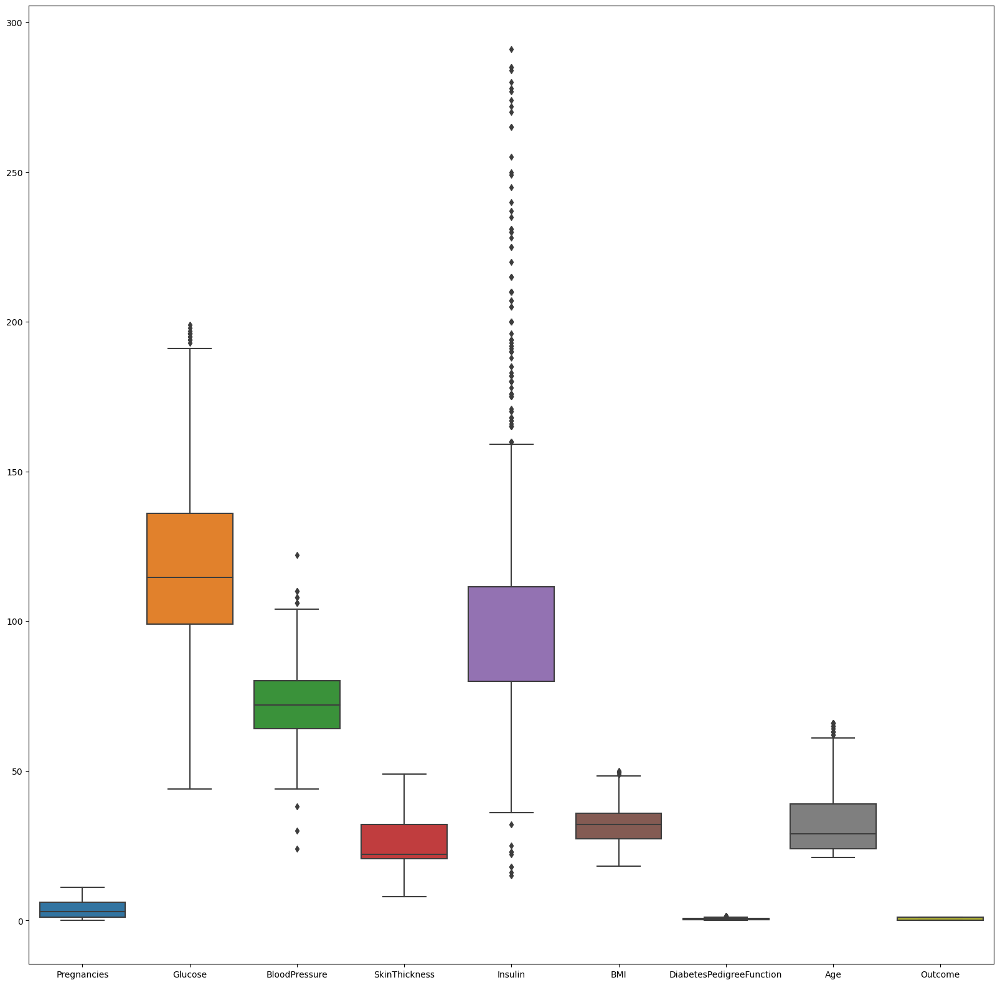

In [16]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data = df_new,ax = ax)

In [17]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [18]:
### df outlier_removal(self,data):
###        def outlier_limits(col):
##            Q3 , Q1 = mp.nanpercentile(col,[75,25])
#            IQR = Q3-Q1
#            UL = Q3+1.5*IQR
#            LL = Q3-1.5*IQR
#            return UL , LL
            
            
 #           for column in data.columns:
 #               if data[column].dtype != 'int64':
  #              UL,LL =outlier_limits(data[column])
  #              data[column] = np.where((data[column]>UL)|data[column] <LL),np.nan,data[column]) ###

In [19]:
y = df_new['Outcome']

In [20]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [21]:
x = df_new.drop(columns=['Outcome'])

In [22]:
x

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47


In [23]:
scalar = StandardScaler()
ProfileReport(pd.DataFrame(scalar.fit_transform(x)))
x_scaled = scalar.fit_transform(x)

In [24]:
df_new_scaler = pd.DataFrame(scalar.fit_transform(df_new))

<AxesSubplot:>

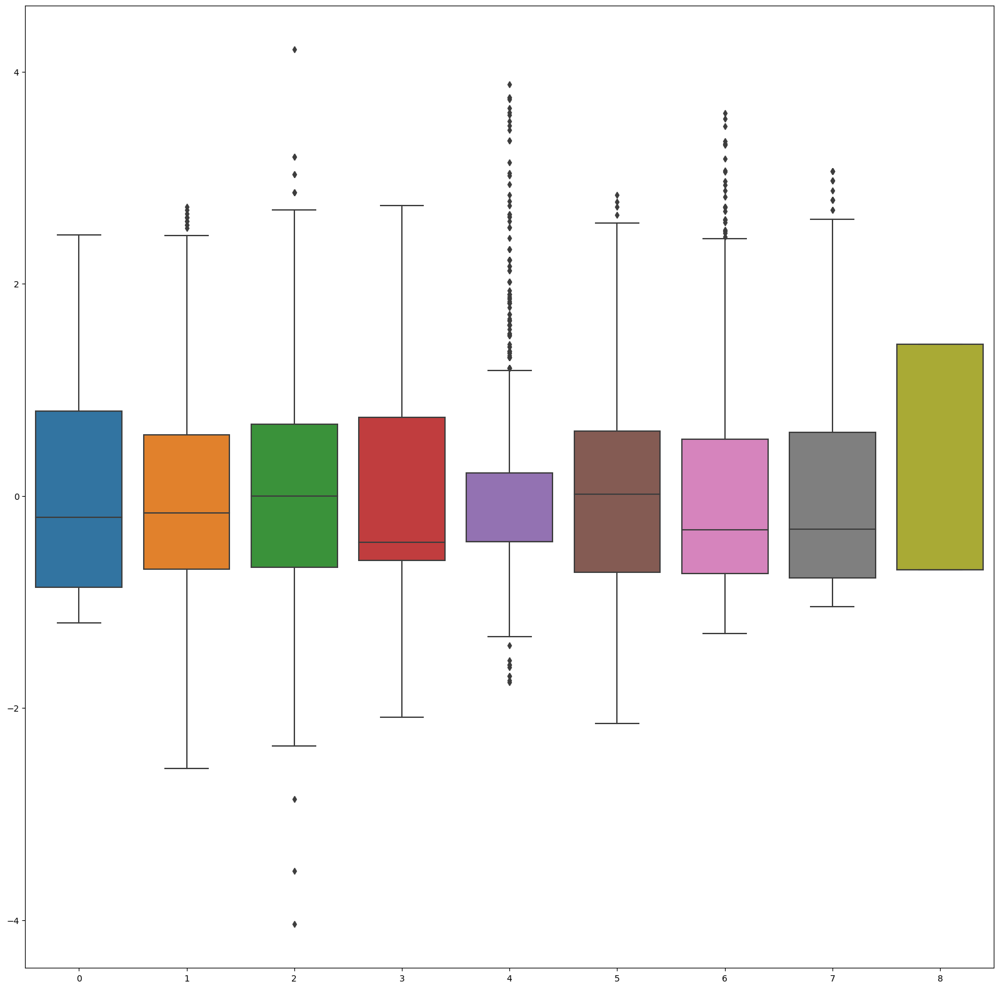

In [25]:
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new_scaler,ax = ax)

Now my datasert is dispersed equally now like its standardized 

In [26]:
x_scaled

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         2.65819648e-01,  6.30484542e-01,  1.60141519e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -8.31445036e-01, -3.38078670e-01, -1.32706484e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
        -1.34872696e+00,  7.88402456e-01, -4.14369227e-02],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -8.94145875e-01, -7.10063091e-01, -2.23976046e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -2.82812694e-01, -3.45097244e-01,  1.32760650e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -2.35787064e-01, -4.64413001e-01, -8.62862978e-01]])

In [27]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

In [28]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i],variance_inflation_factor(arr,i)] for i in range(arr.shape[1])],columns = ["Feature","VIF_SCORE"])

In [29]:
vif_score(x)

,Feature,VIF_SCORE
0,Pregnancies,1.449056
1,Glucose,1.304263
2,BloodPressure,1.262686
3,SkinThickness,1.470049
4,Insulin,1.271017
5,BMI,1.513160
6,DiabetesPedigreeFunction,1.042300
7,Age,1.662728


Here the Value of vif_score is < 10 That means there is no multicollinearity in the dataset 

In [30]:
x_train, x_test , y_train, y_test = train_test_split(x_scaled,y,test_size= 0.20,random_state= 144)

In [31]:
x_train

array([[-0.86479354,  0.19769063, -1.85094678, ...,  0.21879402,
         1.80609569, -0.40651517],
       [ 2.45830136,  1.22329076,  0.33707068, ...,  0.21879402,
         3.1782269 ,  1.69268475],
       [ 0.13213493,  0.91561072,  1.09446134, ..., -0.47091521,
        -0.90658316, -0.49778473],
       ...,
       [-0.86479354, -0.28092276,  1.17861586, ..., -0.28281269,
        -1.06801036, -0.86286298],
       [ 1.46137289,  0.02675728,  0.50537972, ..., -1.08224839,
        -0.13454002,  2.87918905],
       [-0.86479354, -0.75953616, -0.33616546, ..., -0.73739378,
         2.27283086, -0.95413254]])

In [32]:
x_test

array([[ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, ...,
        -4.70915211e-01, -2.50346495e-01,  1.23633694e+00],
       [-1.19710303e+00,  6.76304024e-01, -8.41092564e-01, ...,
        -1.53682948e+00, -8.43415997e-01, -1.04540210e+00],
       [ 2.45830136e+00,  8.13050708e-01,  1.85185200e+00, ...,
         7.36075942e-01, -6.78479508e-01,  1.69268475e+00],
       ...,
       [ 7.96753910e-01, -5.54416131e-01, -5.04474494e-01, ...,
        -1.19197486e+00, -6.96025943e-01, -3.15245608e-01],
       [-5.32484049e-01, -1.20396288e+00, -2.43135269e-01, ...,
         1.38528976e-02, -5.03015158e-01, -1.04540210e+00],
       [-8.64793539e-01, -1.64838960e+00, -2.01925581e+00, ...,
        -1.80330804e+00, -4.36338705e-01, -9.54132539e-01]])

In [33]:
logr = LogisticRegression(verbose=1)

In [34]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [35]:
 logr.predict([x_test[0]])

array([0], dtype=int64)

In [36]:
logr.predict_proba([x_test[0]])

array([[0.83549024, 0.16450976]])

In [37]:
logr.predict_log_proba([x_test[0]])

array([[-0.17973662, -1.80478536]])

In [38]:
y_test.iloc[0]

1

Here we can clearly see that  our predcited output is 1 and the actual output is 0

In [39]:
logr_liblinear = LogisticRegression(solver='liblinear',verbose= 1)

In [40]:
logr_default = LogisticRegression(verbose =1)

In [41]:
logr_liblinear.fit(x_train,y_train)

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [42]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [43]:
y_pred_libliner = logr_liblinear.predict(x_test)

In [44]:
y_pred_default = logr.predict(x_test)

In [45]:
y_pred_default

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [46]:
y_pred_libliner

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [47]:
confusion_matrix(y_test,y_pred_libliner)

array([[77, 10],
       [24, 24]], dtype=int64)

In [48]:
confusion_matrix(y_test,y_pred_default)

array([[77, 10],
       [24, 24]], dtype=int64)

In [49]:
def model_eval(y_true,y_pred):
    tn,fp,fn,tp = confusion_matrix(y_test,y_pred).ravel()
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(fp+tn)
    F1_score = 2*(recall*precision)/(recall+precision)
    result = {"Accuracy" : accuracy,"Precision":precision,"Recall":recall,"Specificity":specificity,"F1_score":F1_score}
    return result
model_eval(y_test,y_pred_libliner)

{'Accuracy': 0.7481481481481481,
 'Precision': 0.7058823529411765,
 'Recall': 0.5,
 'Specificity': 0.8850574712643678,
 'F1_score': 0.5853658536585366}

In [50]:
model_eval(y_test,y_pred_default)

{'Accuracy': 0.7481481481481481,
 'Precision': 0.7058823529411765,
 'Recall': 0.5,
 'Specificity': 0.8850574712643678,
 'F1_score': 0.5853658536585366}

In [51]:
roc_auc_score(y_test,y_pred_libliner)

0.692528735632184

In [52]:
roc_auc_score(y_test,y_pred_default)

0.692528735632184

In [53]:
pickle.dump(logr,open('Diabetes_Predcitioon.pickle','wb'))